In [1]:
#%matplotlib inline
import config.unetConfig as cfg
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os
import random

import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data import BraTSDataset
from gan.GANTrainer import GANTrainer
from gan.UNetGenerator import UNetGenerator
from gan.UNetDiscriminator import UNetDiscriminator
from IPython.display import HTML
from torch.utils.data import DataLoader
from utils import weights_init_norm, weights_init_ortho, plot_train_metrics

!jupyter nbextension enable --py widgetsnbextension

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
Random Seed:  999


## Load the data

#### TODO: Need to do for other classes as well

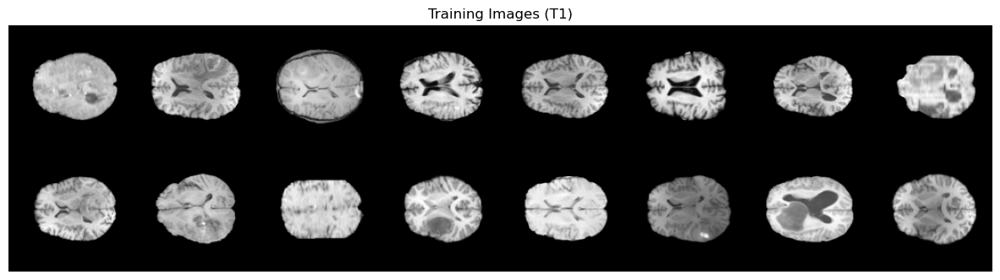

In [2]:
# load the T1 image filepaths in a sorted manner
image_paths = [os.path.join(cfg.T1_DATASET_PATH, impath) for impath in sorted(os.listdir(cfg.T1_DATASET_PATH))]

tf = transforms.Compose([
    transforms.Resize((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.CenterCrop((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.ToTensor(),
    ])

# Create the dataset
dataset = BraTSDataset(image_paths, tf)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=cfg.BATCH_SIZE,
                        shuffle=True, num_workers=cfg.NUM_WORKERS)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Training Images (T1)")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(cfg.DEVICE), scale_each=True, normalize=True).cpu(),(1,2,0)))

## Init Generator and weights

In [4]:
# Create the generator
netG = UNetGenerator(cfg.LATENT_SZ, cfg.NGF, cfg.NGC).to(cfg.DEVICE)

# Apply the weights_init_ortho
netG.apply(weights_init_norm)

# Print the model
print(netG)

UNetGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01, inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01, inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01, inplace=True)
    (1

## Init Discriminator and weights

In [5]:
# Create the Discriminator
netD = UNetDiscriminator(ns=cfg.NEG_SLOPE).to(cfg.DEVICE)

# Apply the weights_init_ortho
netD.apply(weights_init_ortho)

# Print the model
print(netD)

/home/y2k/csc2529-2022-project/src/utils.py:18: UserWarning: nn.init.orthogonal is now deprecated in favor of nn.init.orthogonal_.
  nn.init.orthogonal(m.weight.data)


UNetDiscriminator(
  (encoder): Encoder(
    (enc_blocks): ModuleList(
      (0): DBlock(
        (main): Sequential(
          (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (1): DBlock(
        (main): Sequential(
          (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (2): DBlock(
        (main): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
    )
    (downsample): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (decoder): Decoder(


## Train

In [6]:
trainer = GANTrainer(num_epochs=cfg.NUM_EPOCHS,
                        glr=cfg.GLR, dlr=cfg.DLR,
                        gbeta1=cfg.GBETA1, dbeta1=cfg.DBETA1,
                        dataloader=dataloader,
                        netG=netG, netD=netD,
                        device=cfg.DEVICE)

In [7]:
trainer.train(cfg.LATENT_SZ)

Starting Training Loop...
[0/15][0/24]	Loss_D: 1.4435	Loss_G: 0.8674	D(x): 0.4818	D(G(z)): 0.5099 / 0.4201
[0/15][12/24]	Loss_D: 0.6732	Loss_G: 3.0220	D(x): 0.9868	D(G(z)): 0.4812 / 0.0508
[1/15][0/24]	Loss_D: 0.4192	Loss_G: 1.2420	D(x): 0.7346	D(G(z)): 0.0318 / 0.2931
[1/15][12/24]	Loss_D: 0.0696	Loss_G: 3.0316	D(x): 0.9926	D(G(z)): 0.0601 / 0.0489
[2/15][0/24]	Loss_D: 0.0463	Loss_G: 4.3436	D(x): 0.9724	D(G(z)): 0.0125 / 0.0134
[2/15][12/24]	Loss_D: 0.8196	Loss_G: 1.1909	D(x): 0.9540	D(G(z)): 0.5339 / 0.3060
[3/15][0/24]	Loss_D: 0.3404	Loss_G: 1.5916	D(x): 0.8902	D(G(z)): 0.1939 / 0.2074
[3/15][12/24]	Loss_D: 0.0918	Loss_G: 2.8813	D(x): 0.9777	D(G(z)): 0.0646 / 0.0647
[4/15][0/24]	Loss_D: 0.4129	Loss_G: 2.4301	D(x): 0.7349	D(G(z)): 0.0270 / 0.0894
[4/15][12/24]	Loss_D: 0.0364	Loss_G: 6.8962	D(x): 0.9680	D(G(z)): 0.0010 / 0.0011
[5/15][0/24]	Loss_D: 0.1781	Loss_G: 4.8513	D(x): 0.9996	D(G(z)): 0.1595 / 0.0093
[5/15][12/24]	Loss_D: 0.8009	Loss_G: 1.1993	D(x): 0.6996	D(G(z)): 0.3378 / 0.3

## Plot Training Results

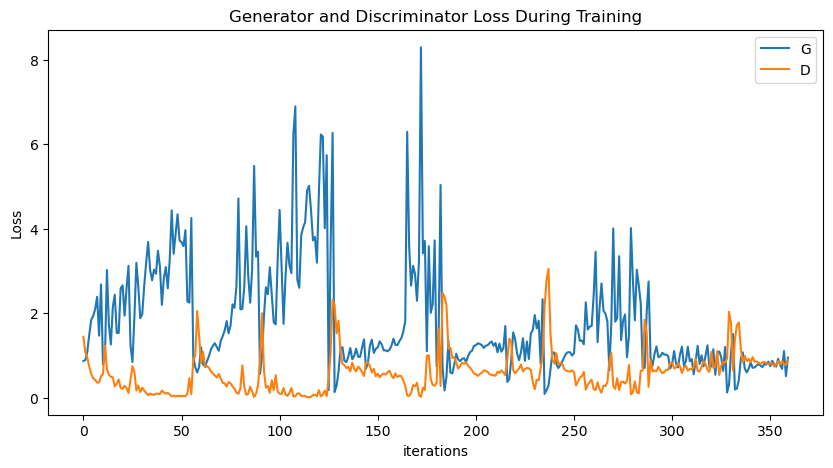

In [8]:
plot_train_metrics(trainer.G_losses, trainer.D_losses)

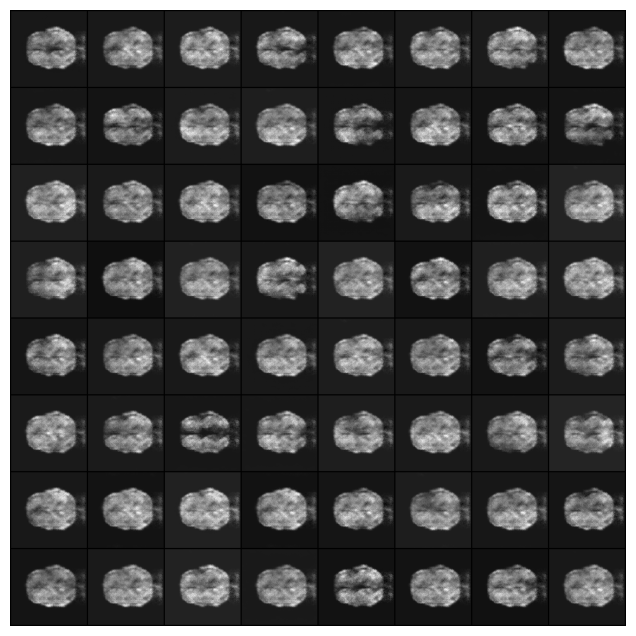

In [9]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in trainer.img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Save the Trained Model

In [24]:
from datetime import datetime

f'TIME IS: {}'

'TIME IS: 20221130T004320'

In [10]:
torch.save(netD, f"models/unetgan_D_{datetime.now().strftime('%Y%m%dT%H%M%S')}.pth")
torch.save(netG, f"models/unetgan_G_{datetime.now().strftime('%Y%m%dT%H%M%S')}.pth")

(-0.5, 1041.5, 521.5, -0.5)

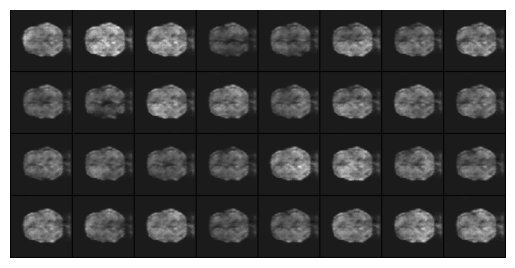

In [28]:
netG.eval()

fixed_noise = torch.randn(32, 100, 1, 1, device=cfg.DEVICE)

fake = netG(fixed_noise).detach().cpu()

plt.imshow(
    np.transpose(
        vutils.make_grid(fake, padding=2, normalize=True),
        (1, 2, 0)
    )
)
plt.axis("off")